In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np
import matplotlib.pyplot as plt

from dice_rl_TU_Vienna.plot.continuous import get_log
from dice_rl_TU_Vienna.utils.json import json_get_id
from dice_rl_TU_Vienna.utils.general import iterate_print, merge_dicts

from plugins.boyan_chain.continuous.plot import get_logs_and_plot
from plugins.boyan_chain.continuous.config import *

/Users/richardweiss/Documents/.venvs/dice_rl_TU_Vienna/lib/python3.11/site-packages/torch/utils/_pytree.py:185: FutureWarning: optree is installed but the version is too old to support PyTorch Dynamo in C++ pytree. C++ pytree support is disabled. Please consider upgrading optree using `python3 -m pip install --upgrade 'optree>=0.13.0'`.
  warnings.warn(


# Selected Plots

## Prepare

In [4]:
def plot(logs, tag, analytical, suptitle, title, labels, colors, markers, ylabel, ylim, yscale, ycompute):

    plt.plot()

    if analytical is not None:
        plt.axhline(y=analytical, label="analytical", color="black", linestyle=":")

    for i, (k, v) in enumerate( logs.items() ):

        x = []; y = []
        for seed in seeds:

            x_ = np.array(v[seed]["data"][tag]["steps"])
            y_ = np.array(v[seed]["data"][tag]["values"])
            if ycompute is not None:
                y_ = ycompute(y_)

            x.append(x_)
            y.append(y_)

        ml_x = np.max([ len(x_) for x_ in x ])
        ml_y = np.max([ len(y_) for y_ in y ])
        assert ml_x == ml_y
        ml = np.random.choice([ml_x, ml_y])

        f = False
        for x_ in x:
            if len(x_) == ml_x:
                x = x_; f = True; break
        assert f

        y_mean = np.array([ np.mean([ y_[i] for y_ in y if i < len(y_) ]) for i in range(ml) ])
        y_std  = np.array([ np.std ([ y_[i] for y_ in y if i < len(y_) ]) for i in range(ml) ])

        y_down = y_mean - y_std * std_girth
        y_up   = y_mean + y_std * std_girth

        plt.plot(x, y_mean, label=labels[i], color=colors[i], marker=markers[i], markevery=markevery, alpha=0.75)
        plt.fill_between(x, y_down, y_up, color=colors[i], alpha=alpha)

    plt.grid(linestyle=":")
    plt.legend()

    plt.xlabel("step")
    plt.ylabel(ylabel)

    if yscale == "log":
        plt.yscale("log")

    if yscale == "pi":
        pi_ticks = np.arange(0, 3/8 * np.pi, 1/8 * np.pi)
        pi_labels = [r"$0$", r"$\frac{\pi}{8}$", r"$\frac{\pi}{4}$"]
        plt.yticks(pi_ticks, pi_labels)

    if ylim is not None: plt.ylim(ylim)

    plt.suptitle(suptitle)
    plt.title(title)

    file_name = f"{suptitle}; {title}"
    path = os.path.join(dir_images, "continuous", f"{file_name}.png")
    plt.savefig(path, bbox_inches="tight")

    plt.show()


def plot_pv(logs, weighted, analytical, suptitle, title, labels, colors, markers, ylim=None):
    tag = "pv_w" if weighted else "pv_s"
    ylabel = r"$\rho^\pi(\gamma)$"
    yscale = None
    ycompute = None
    plot(logs, tag, analytical, suptitle, title, labels, colors, markers, ylabel, ylim, yscale, ycompute)


def plot_sdc(logs, suptitle, title, labels, colors, markers):
    tag = "sdc_L2_error"
    analytical = None
    ylabel = r"$\mathbb{E}_D | \hat{w}_{\pi / D}(\gamma) - w_{\pi / D}(\gamma) |^2$"
    ylim = [5e-4, 5e1]
    yscale = "log"
    ycompute = None
    plot(logs, tag, analytical, suptitle, title, labels, colors, markers, ylabel, ylim, yscale, ycompute)


def plot_angles(logs, suptitle, title, labels, colors, markers):
    tag = "cos_angle"
    analytical = None
    ylabel = r"$\measuredangle ( \nabla P^\pi v, \nabla v )$"
    ylim = None
    yscale = "pi"
    ycompute = np.arccos
    plot(logs, tag, analytical, suptitle, title, labels, colors, markers, ylabel, ylim, yscale, ycompute)

In [7]:
logs = {
    "episodic": { gamma_: { name: {} for name in names["episodic"] } for gamma_ in gamma[kind] },
    "continuing": { name: {} for name in names["continuing"] }
}

## Episodic

In [5]:
kind = "episodic"

In [8]:
for gamma_ in iterate_print(gamma[kind], "gamma"):
    for name in iterate_print(names[kind], "name"):
        for seed in iterate_print(seeds, "seed"):

            dictionary = hyperparameters_evaluation[kind][seed][(gamma_, name)]
            if dictionary is None: continue

            id_dataset = json_get_id(
                file_path=os.path.join(dir_data, "dataset.json"),
                dictionary={ "seed": seed, "n_samples": n_samples, "N": N,  "kind": kind, }, )

            id_evaluation = json_get_id(
                file_path=os.path.join(dir_data, id_dataset, "evaluation.json"), # type: ignore
                dictionary=dictionary, )

            logs[kind][gamma_][name][seed] = get_log(
                log_dir=os.path.join(dir_data, id_dataset, id_evaluation), ) # type: ignore

gamma=0.1
name=NeuralDualDice
seed=0
seed=1
seed=2
seed=3
name=NeuralGradientDice
seed=0
seed=1
seed=2
seed=3
name=NeuralGenDice
seed=0
seed=1
seed=2
seed=3
gamma=0.5
name=NeuralDualDice
seed=0
seed=1
seed=2
seed=3
name=NeuralGradientDice
seed=0
seed=1
seed=2
seed=3
name=NeuralGenDice
seed=0
seed=1
seed=2
seed=3
gamma=0.9
name=NeuralDualDice
seed=0
seed=1
seed=2
seed=3
name=NeuralGradientDice
seed=0
seed=1
seed=2
seed=3
name=NeuralGenDice
seed=0
seed=1
seed=2
seed=3


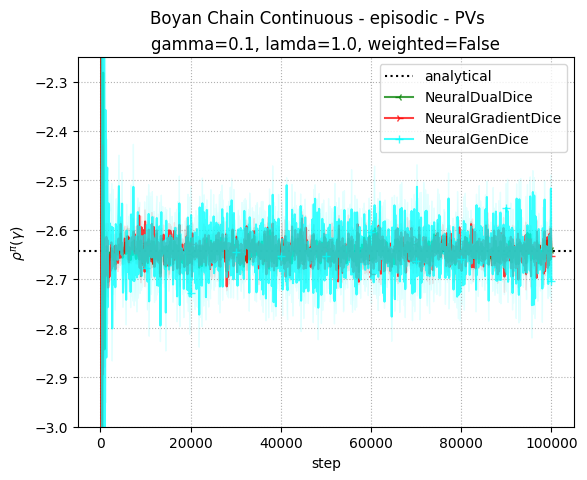

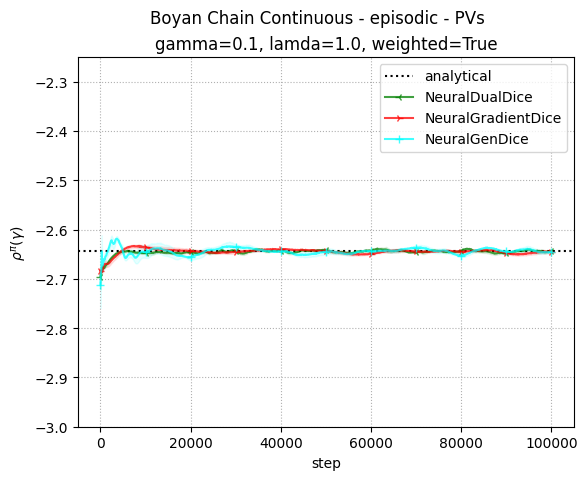

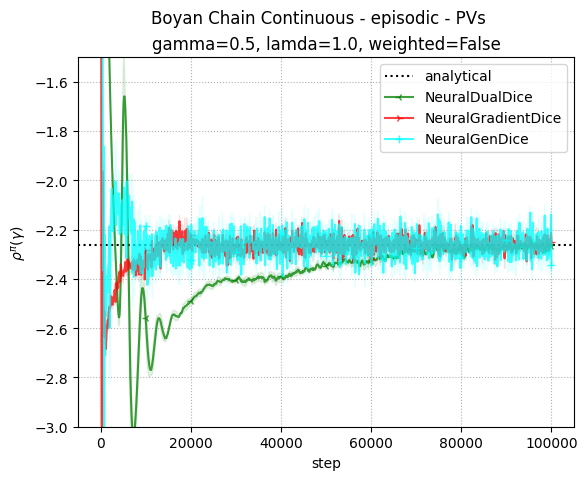

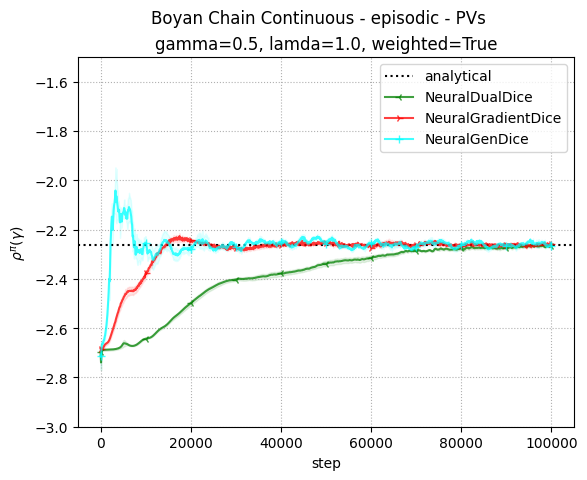

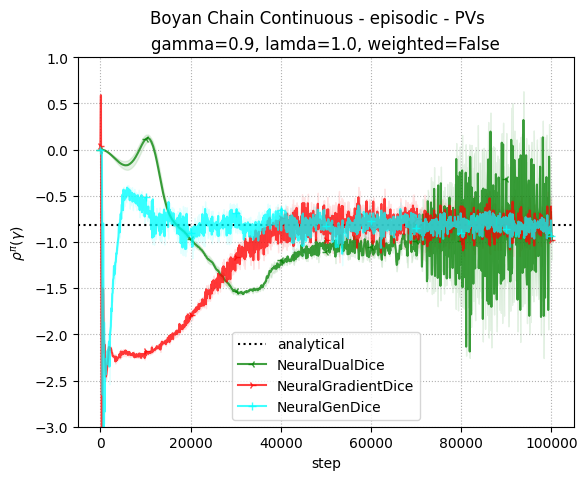

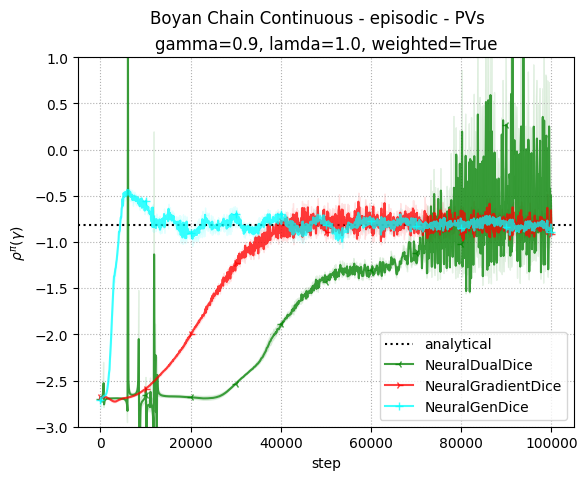

In [10]:
ylims = {
    0.1: (-3, -2.25),
    0.5: (-3, -1.5),
    0.9: (-3, 1),
}

for gamma_ in gamma[kind]:
    for weighted in [False, True]:
        plot_pv(
            logs[kind][gamma_],
            weighted=weighted,
            analytical=analytical_solver[kind].solve(gamma_)[0], # type: ignore
            suptitle="Boyan Chain Continuous - episodic - PVs",
            title=f"gamma={gamma_}, lamda={lamda[kind]}, weighted={weighted}",
            labels=labels[kind],
            colors=colors[kind],
            markers=markers[kind],
            ylim=ylims[gamma_],
        )

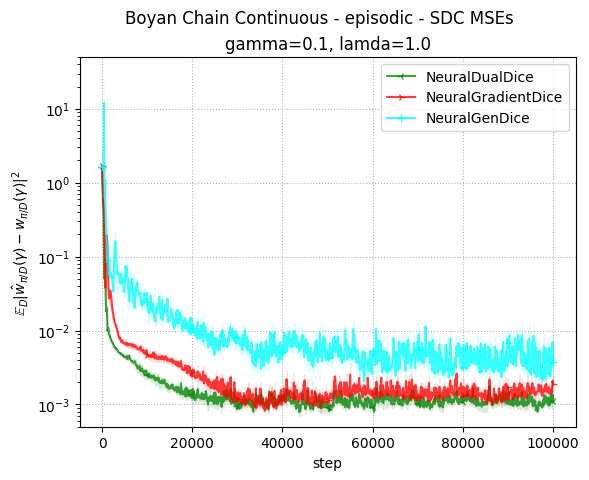

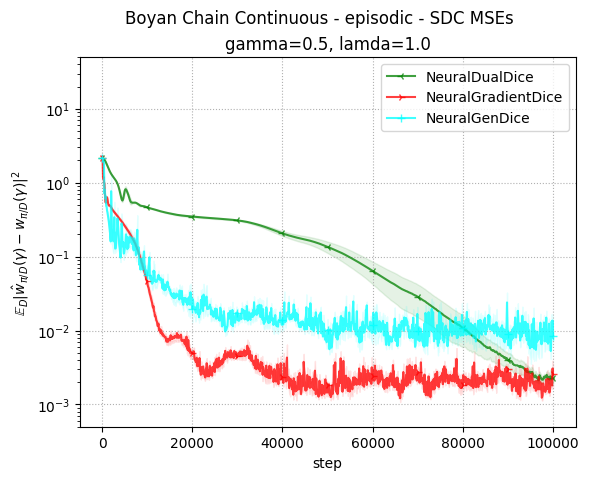

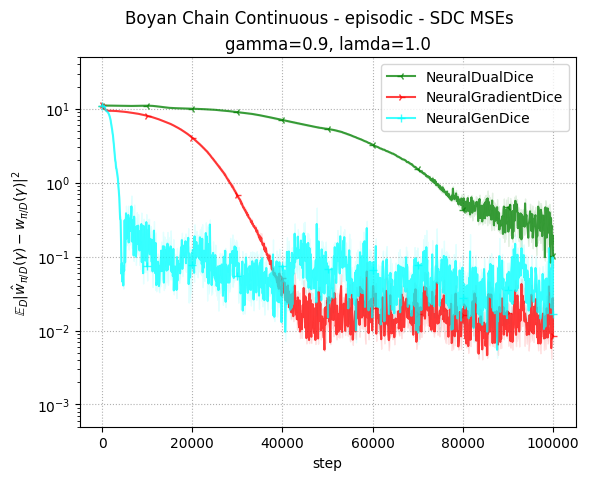

In [11]:
for gamma_ in gamma[kind]:
    plot_sdc(
        logs[kind][gamma_],
        suptitle="Boyan Chain Continuous - episodic - SDC MSEs",
        title=f"gamma={gamma_}, lamda={lamda[kind]}",
        labels=labels[kind],
        colors=colors[kind],
        markers=markers[kind],
    )

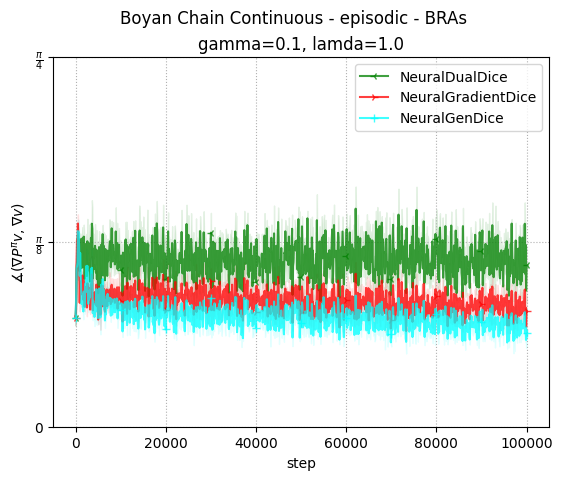

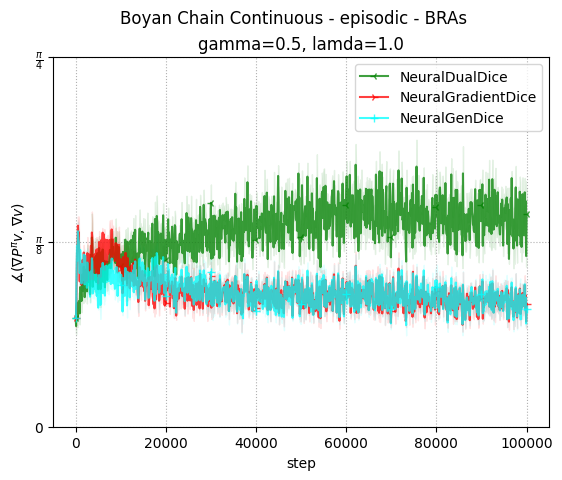

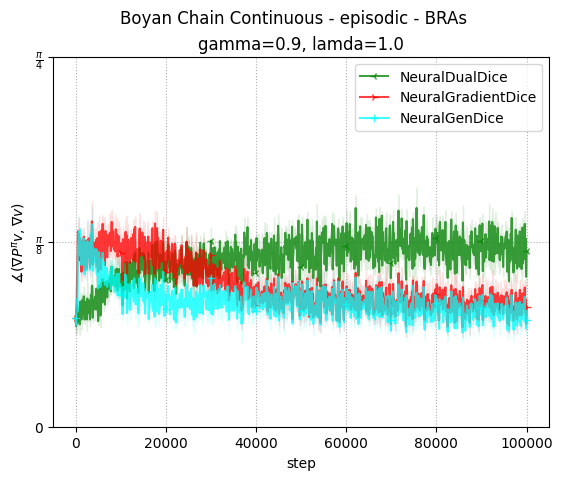

In [12]:
for gamma_ in gamma[kind]:
    plot_angles(
        logs[kind][gamma_],
        suptitle="Boyan Chain Continuous - episodic - BRAs",
        title=f"gamma={gamma_}, lamda={lamda[kind]}",
        labels=labels[kind],
        colors=colors[kind],
        markers=markers[kind],
    )

## Continuing

In [17]:
kind = "continuing"

In [18]:
for name in iterate_print(names[kind], "name"):
    for seed in iterate_print(seeds, "seed"):

        id_dataset = json_get_id(
            file_path=os.path.join(dir_data, "dataset.json"),
            dictionary={ "seed": seed, "n_samples": n_samples, "N": N,  "kind": kind, }, )

        id_evaluation = json_get_id(
            file_path=os.path.join(dir_data, id_dataset, "evaluation.json"), # type: ignore
            dictionary=hyperparameters_evaluation[kind][seed][name], )

        logs[kind][name][seed] = get_log(
            log_dir=os.path.join(dir_data, id_dataset, id_evaluation) # type: ignore
        )

name=NeuralGradientDice
seed=0
seed=1
seed=2
seed=3
name=NeuralGenDice
seed=0
seed=1
seed=2
seed=3


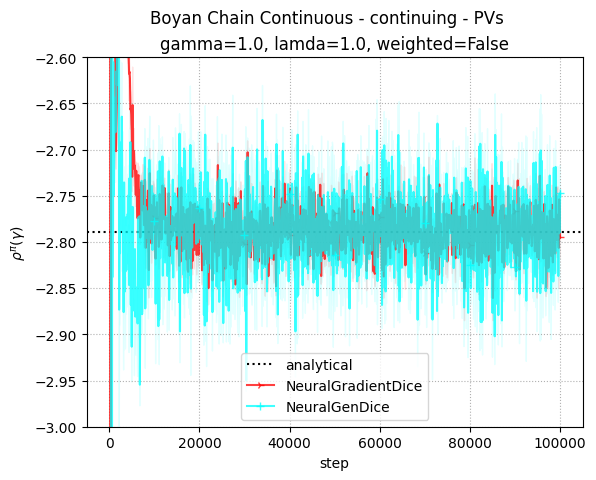

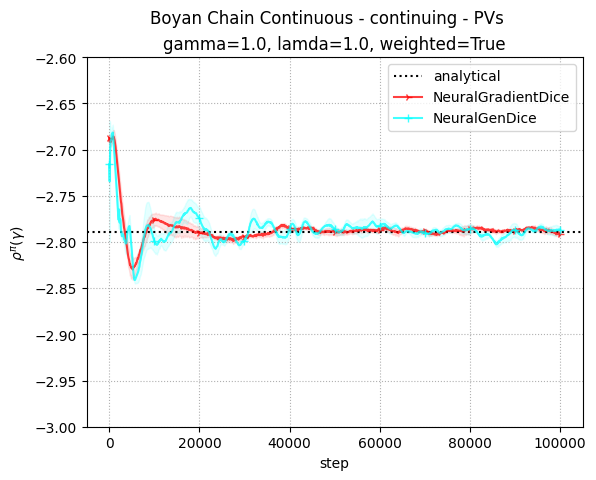

In [19]:
for weighted in [False, True]:
    plot_pv(
        logs[kind],
        weighted=weighted,
        analytical=analytical_solver[kind].solve(gamma[kind], primal_dual="dual")[0], # type: ignore
        suptitle="Boyan Chain Continuous - continuing - PVs",
        title=f"gamma={gamma[kind]}, lamda={lamda[kind][i_lamda_best]}, weighted={weighted}",
        labels=labels[kind],
        colors=colors[kind],
        markers=markers[kind],
        ylim=(-3, -2.6),
    )

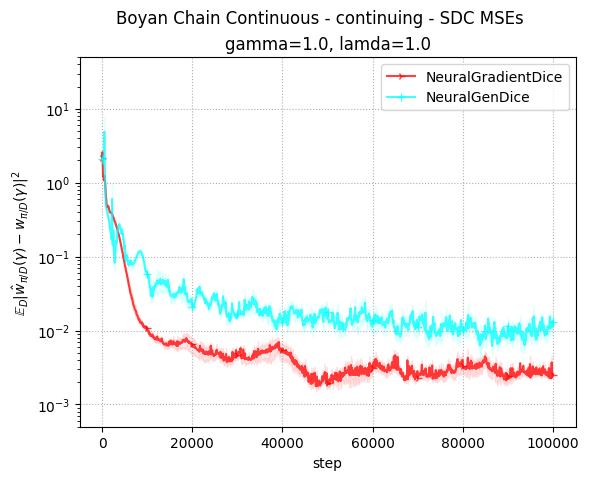

In [20]:
plot_sdc(
    logs[kind],
    suptitle="Boyan Chain Continuous - continuing - SDC MSEs",
    title=f"gamma={gamma[kind]}, lamda={lamda[kind][i_lamda_best]}",
    labels=labels[kind],
    colors=colors[kind],
    markers=markers[kind],
)

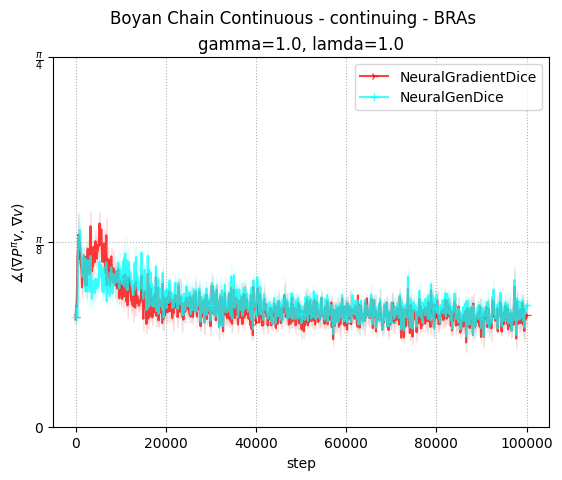

In [21]:
plot_angles(
    logs[kind],
    suptitle="Boyan Chain Continuous - continuing - BRAs",
    title=f"gamma={gamma[kind]}, lamda={lamda[kind][i_lamda_best]}",
    labels=labels[kind],
    colors=colors[kind],
    markers=markers[kind],
)

# All Plots

## DualDICE

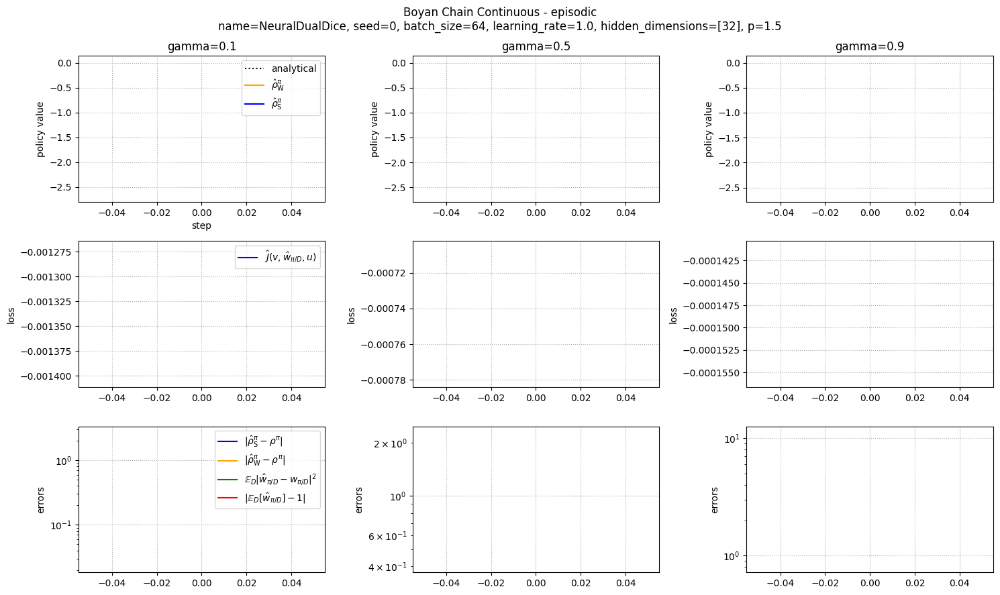

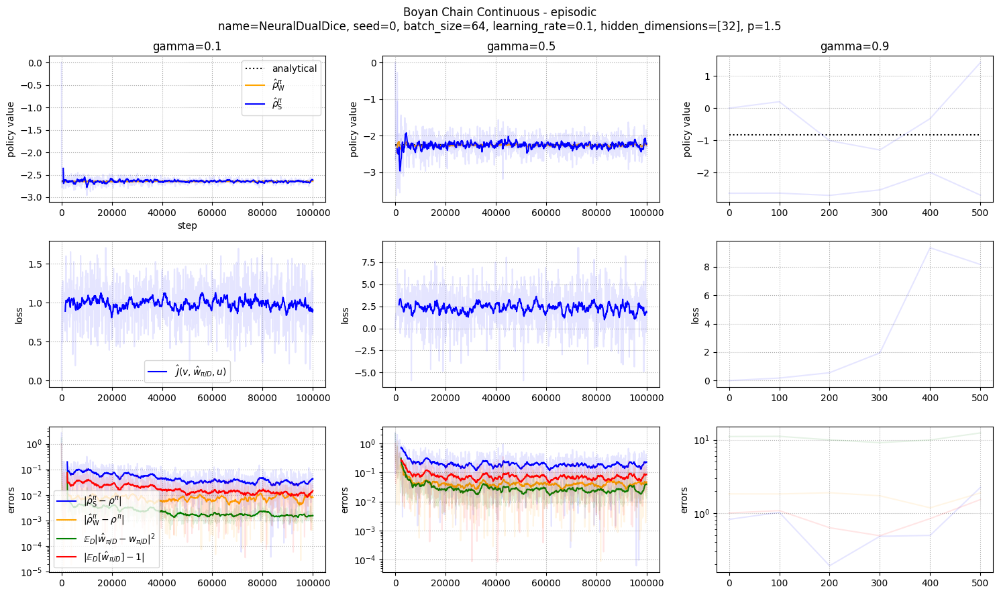

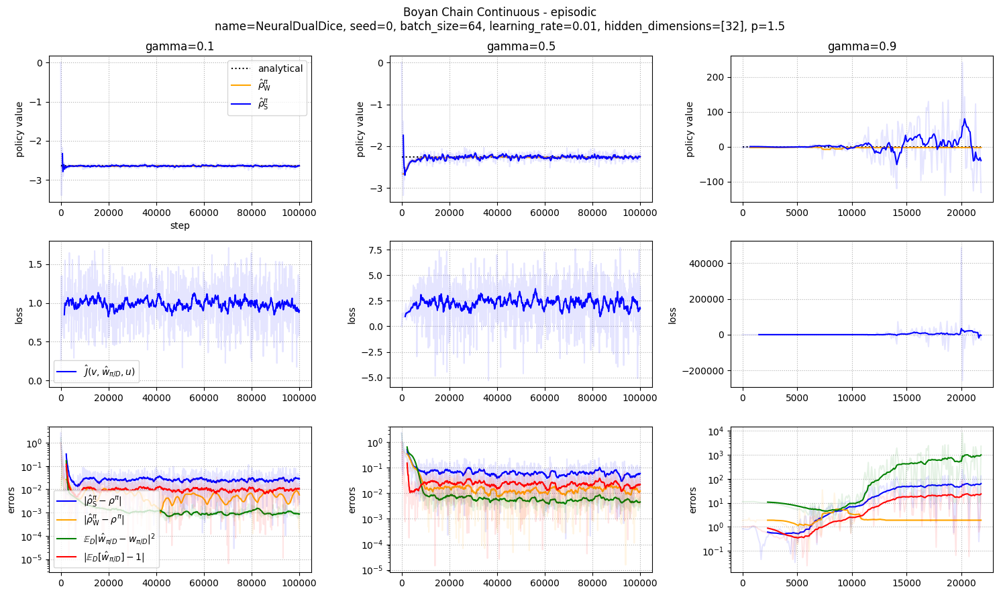

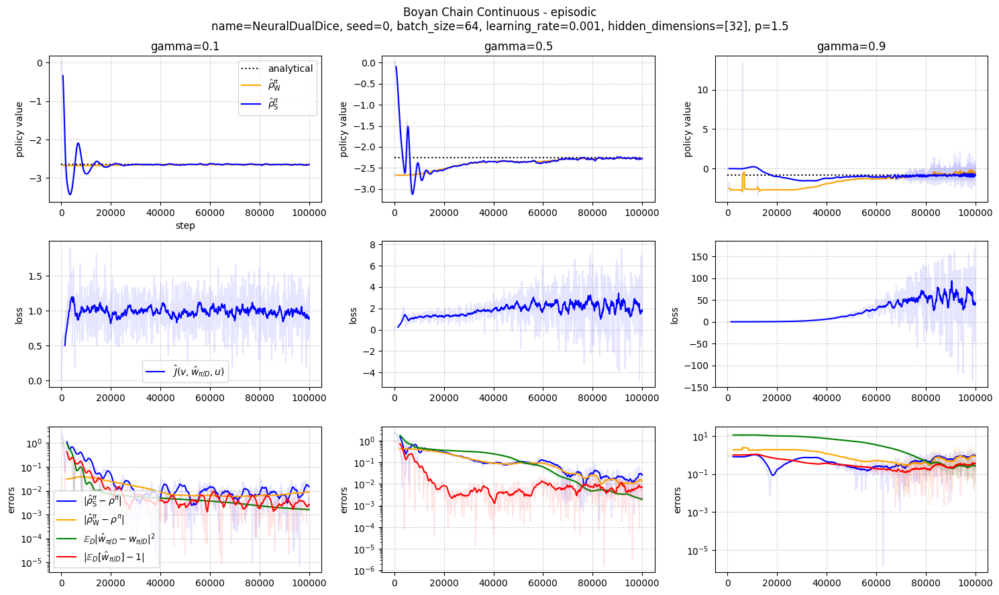

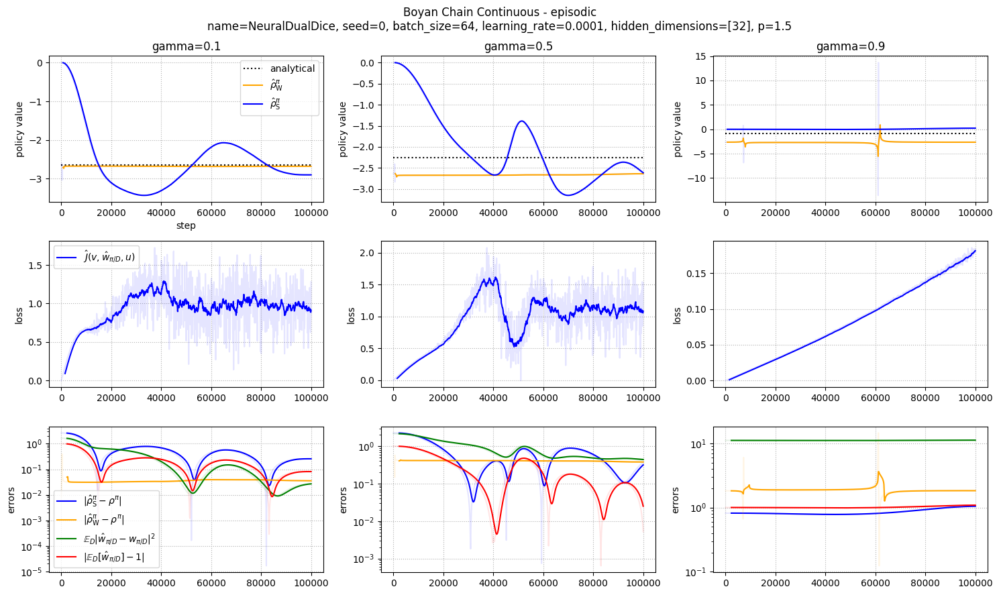

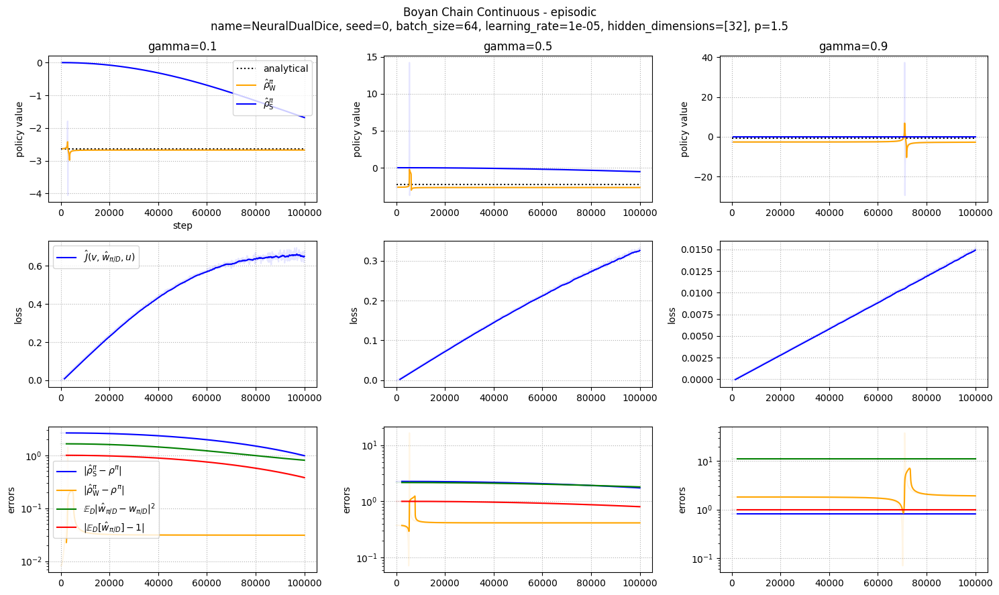

In [ ]:
kind = "episodic"

for learning_rate in [1e0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5]:
    get_logs_and_plot(
        analytical_solver=analytical_solver[kind],
        hyperparameters_evaluation=[
            {
                "name": "NeuralDualDice",
                "gamma": gamma_,
                "seed": 0,
                "batch_size": batch_size,
                "learning_rate": learning_rate,
                "hidden_dimensions": hidden_dimensions,
                "p": p,
            }
                for gamma_ in gamma[kind]
        ],
        hyperparameters_dataset={
            "seed": 0,
            "n_samples": n_samples,
            "N": N,
            "kind": kind,
        },
        n_samples_moving_average=3*[
            merge_dicts(
                { "pv_s": 8, "pv_w": 8, },
                { error_name: 24 for error_name in error_names },
                { "loss": 16, }
            )
        ],
        dir_save=os.path.join(dir_images, "continuous"),
    )

## GenDICE

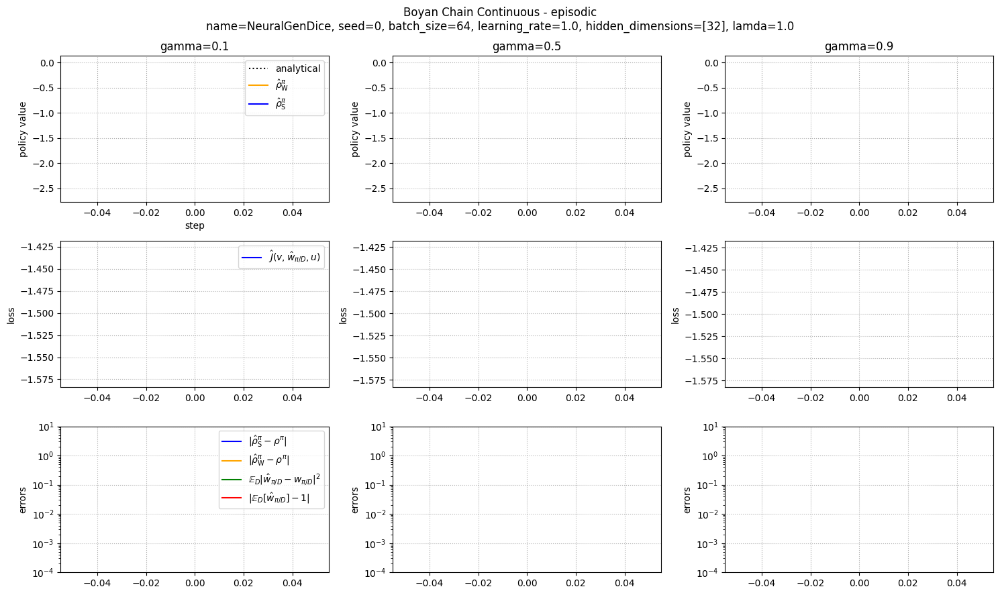

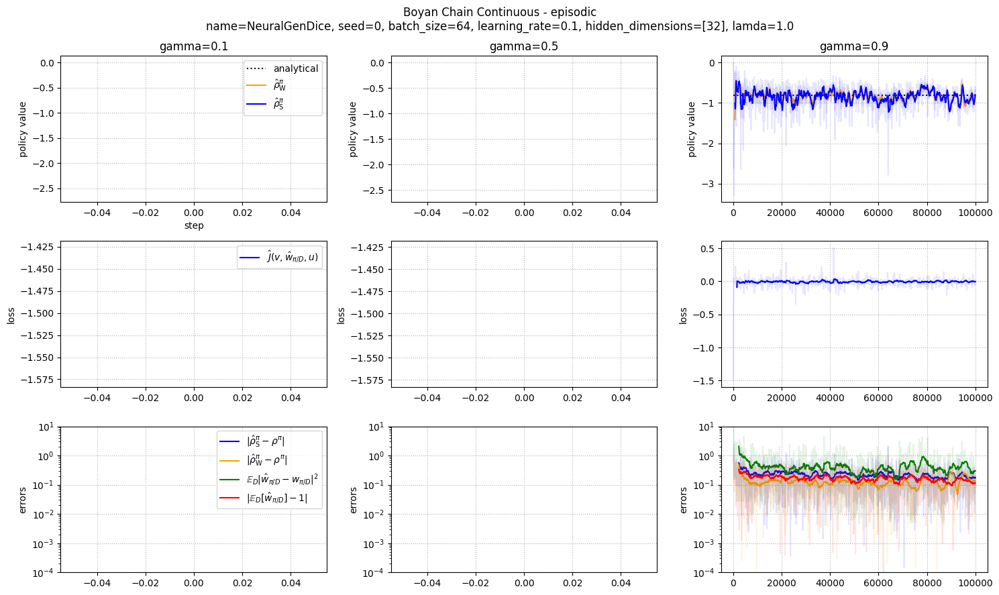

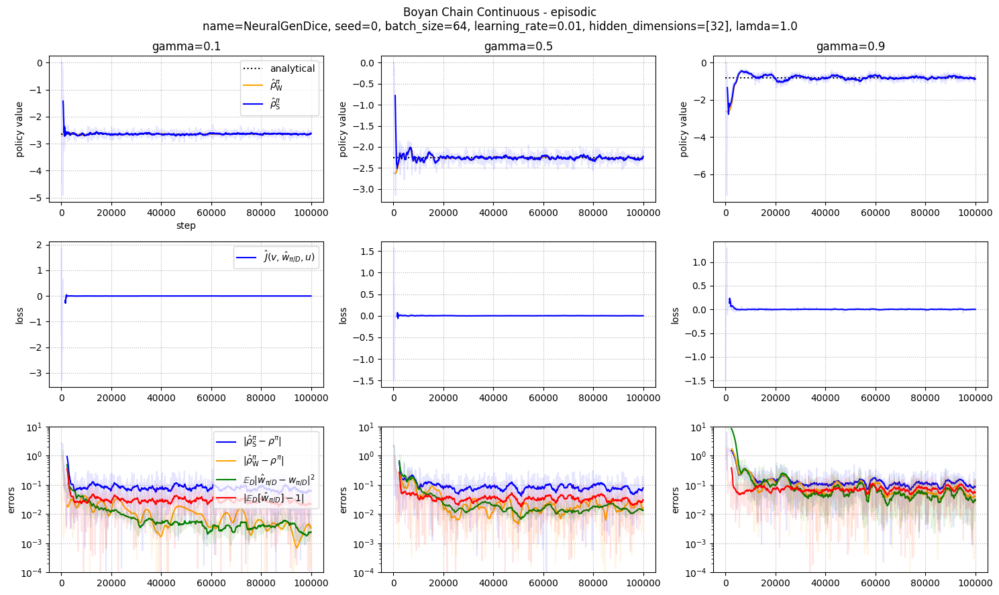

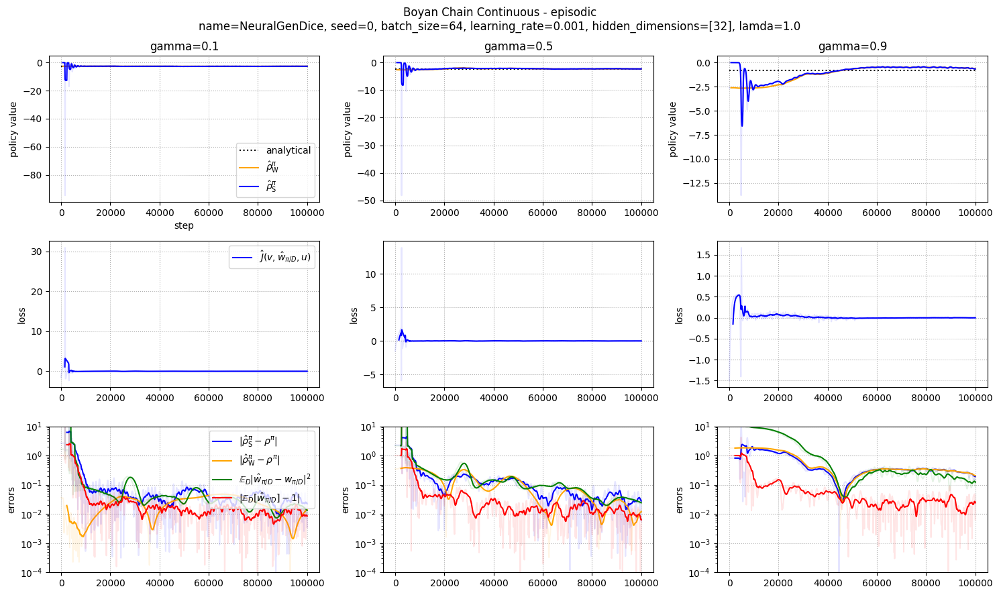

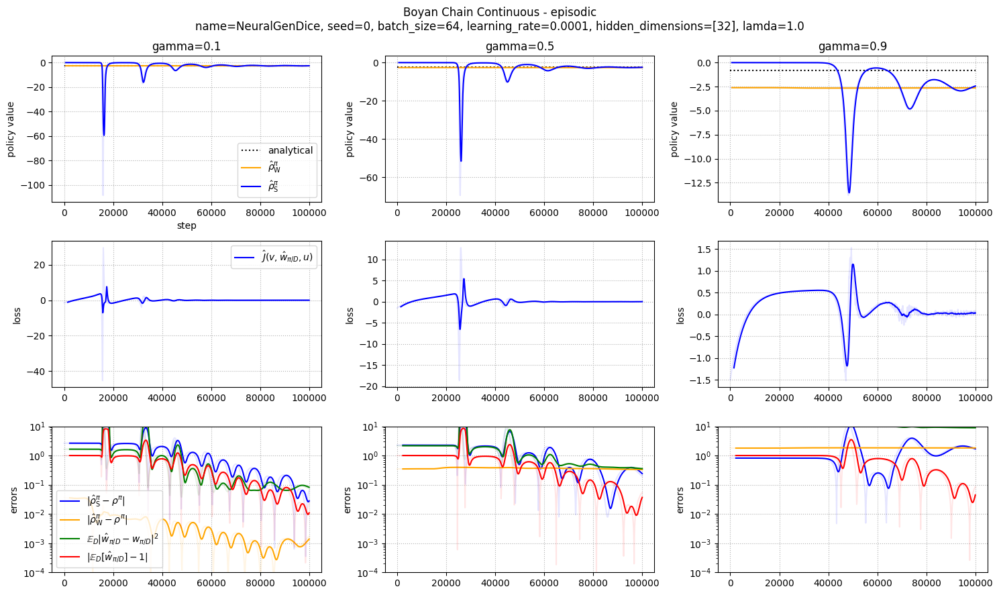

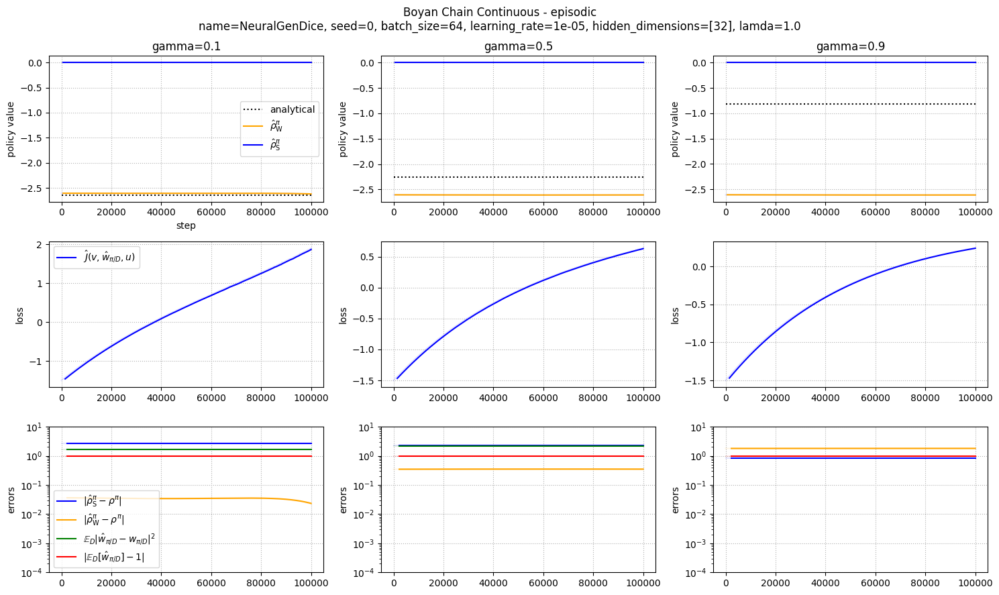

In [ ]:
kind = "episodic"

for learning_rate in [1e0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5]:
    get_logs_and_plot(
        analytical_solver=analytical_solver[kind],
        hyperparameters_evaluation=[
            {
                "name": "NeuralGenDice",
                "gamma": gamma_,
                "seed": 0,
                "batch_size": batch_size,
                "learning_rate": learning_rate,
                "hidden_dimensions": hidden_dimensions,
                "lamda": lamda[kind],
            }
                for gamma_ in gamma[kind]
        ],
        ylims=3*[
            { "errors": (1e-4, 1e1), }
        ],
        hyperparameters_dataset={
            "seed": 0,
            "n_samples": n_samples,
            "N": N,
            "kind": kind,
        },
        n_samples_moving_average=3*[
            merge_dicts(
                { "pv_s": 8, "pv_w": 8, },
                { error_name: 24 for error_name in error_names },
                { "loss": 16, }
            )
        ],
        dir_save=os.path.join(dir_images, "continuous"),
    )

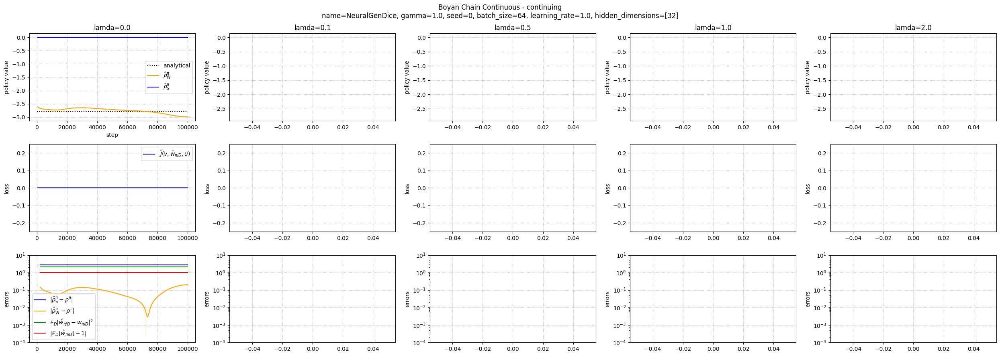

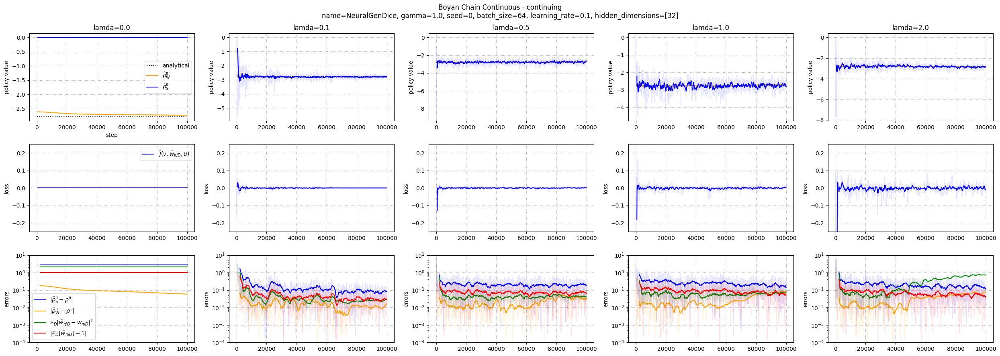

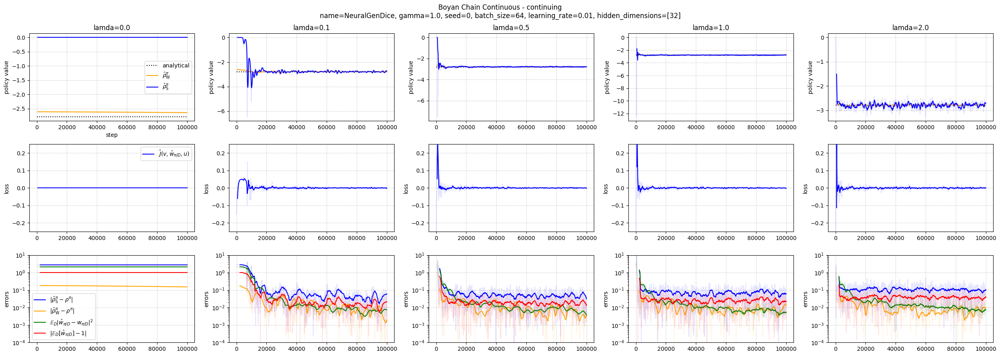

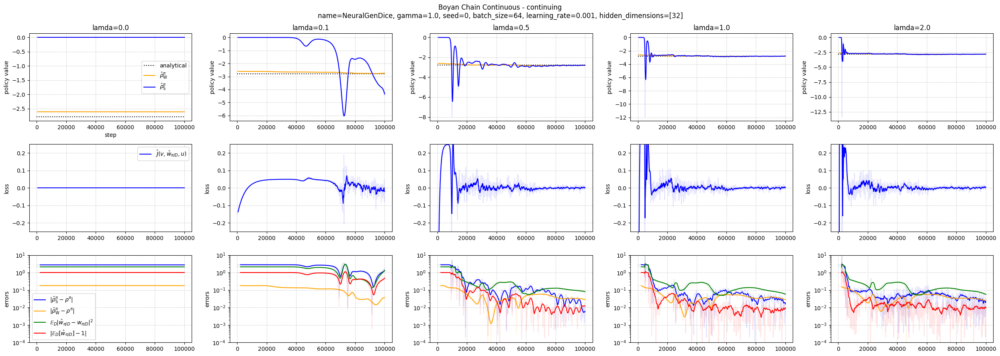

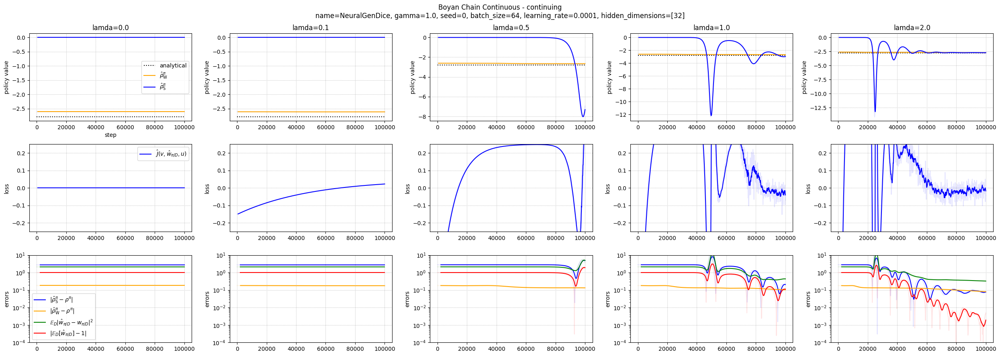

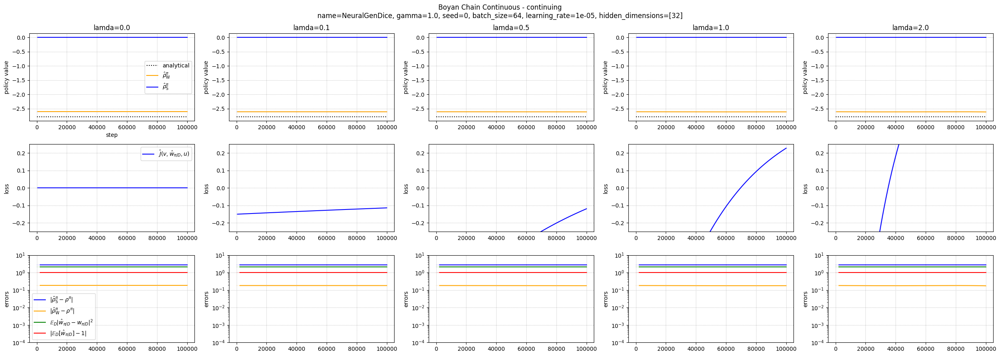

In [ ]:
kind = "continuing"

for learning_rate in [1e0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5]:
    get_logs_and_plot(
        analytical_solver=analytical_solver[kind],
        hyperparameters_evaluation=[
            {
                "name": "NeuralGenDice",
                "gamma": gamma[kind],
                "seed": 0,
                "batch_size": batch_size,
                "learning_rate": learning_rate,
                "hidden_dimensions": hidden_dimensions,
                "lamda": lamda_,
            }
                for lamda_ in lamda[kind]
        ],
        ylims=5*[
            { "errors": (1e-4, 1e1), "loss": (-0.25, 0.25), }
        ],
        hyperparameters_dataset={
            "seed": 0,
            "n_samples": n_samples,
            "N": N,
            "kind": kind,
        },
        n_samples_moving_average=5*[
            merge_dicts(
                { "pv_s": 8, "pv_w": 8, },
                { error_name: 24 for error_name in error_names },
                { "loss": 8, }
            )
        ],
        dir_save=os.path.join(dir_images, "continuous"),
    )

## GradientDICE

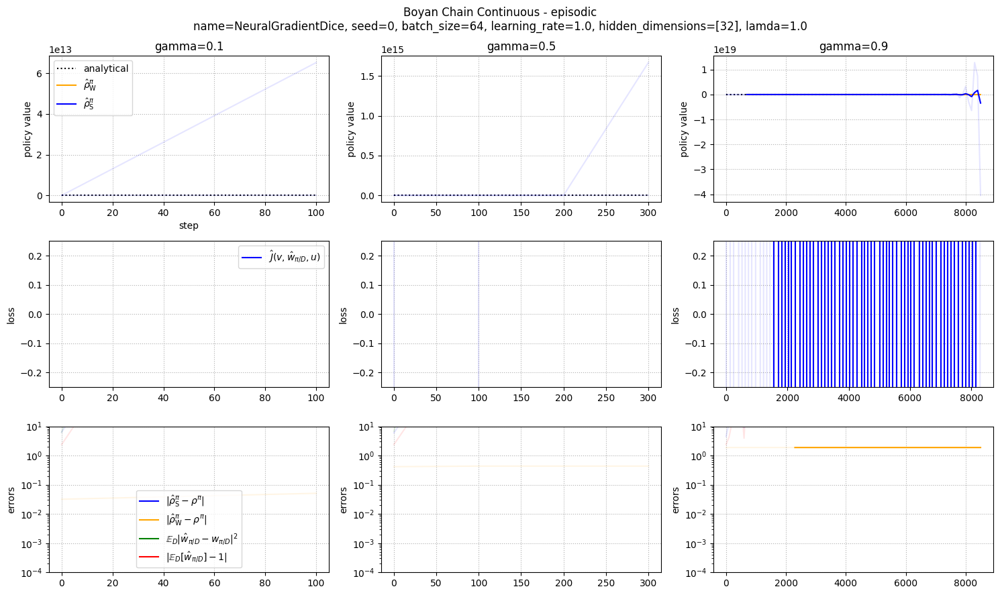

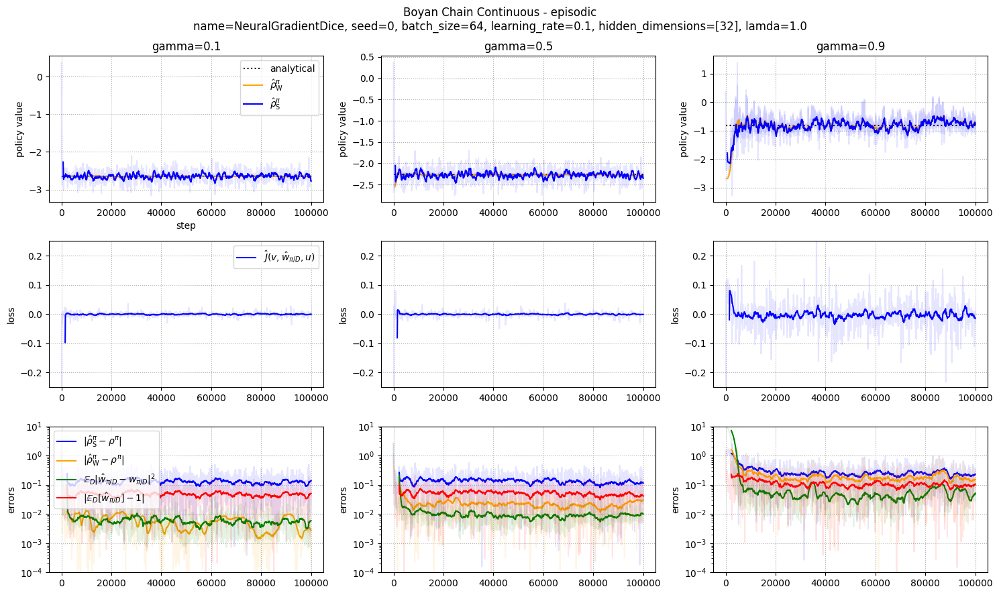

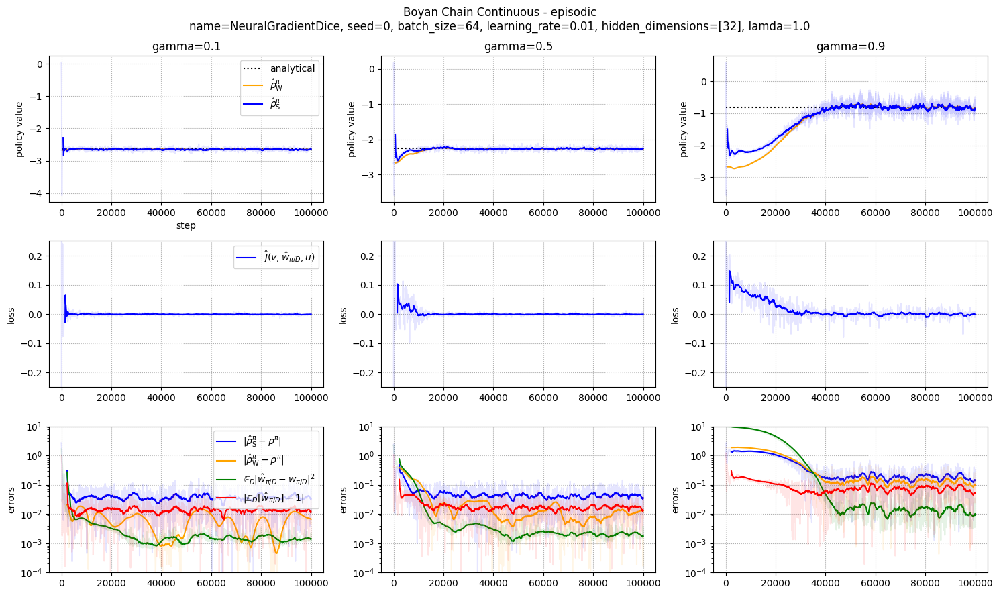

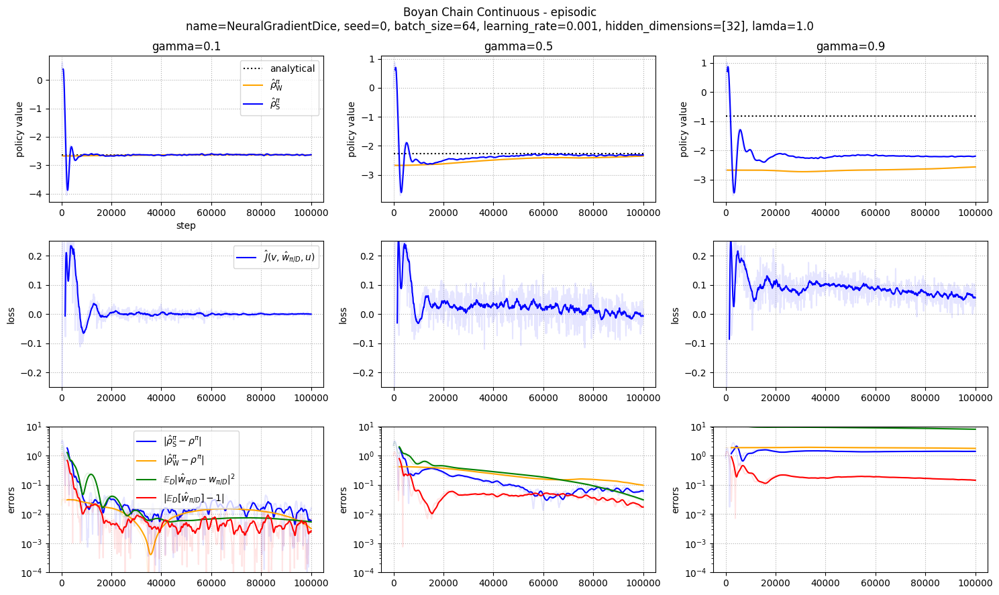

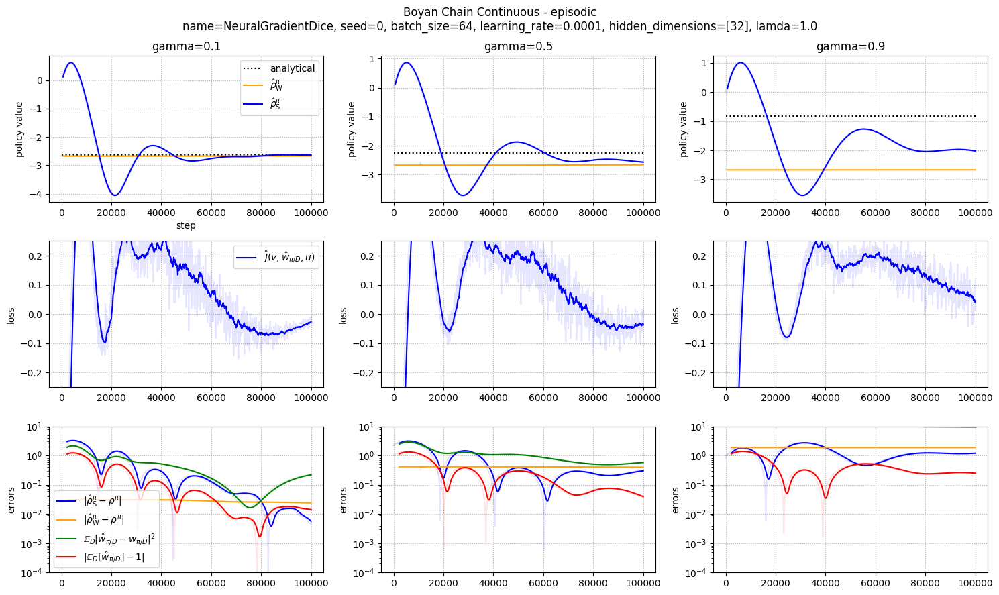

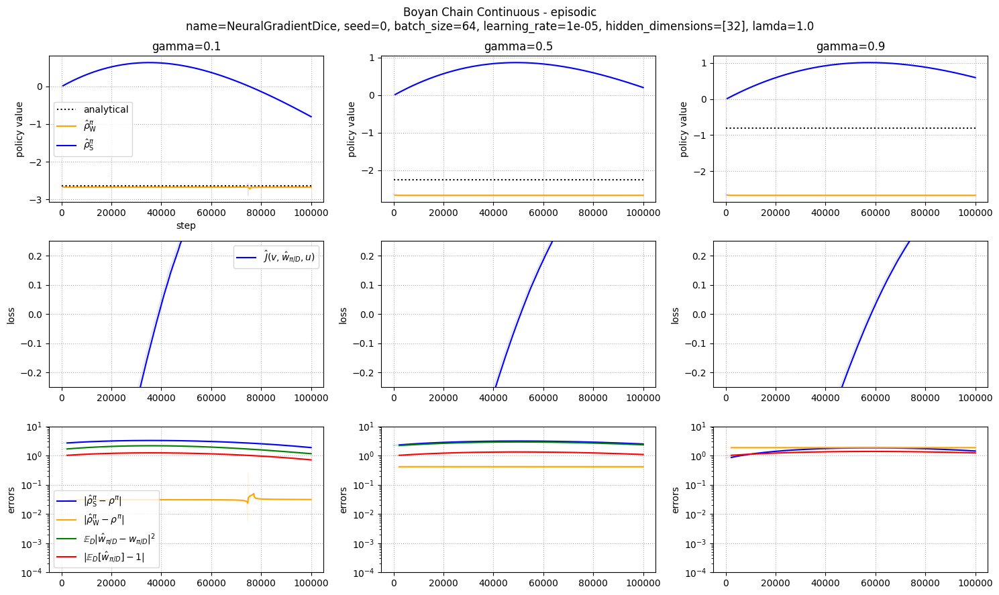

In [ ]:
kind = "episodic"

for learning_rate in [1e0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5]:
    get_logs_and_plot(
        analytical_solver=analytical_solver[kind],
        hyperparameters_evaluation=[
            {
                "name": "NeuralGradientDice",
                "gamma": gamma_,
                "seed": 0,
                "batch_size": batch_size,
                "learning_rate": learning_rate,
                "hidden_dimensions": hidden_dimensions,
                "lamda": 1.0,
            }
                for gamma_ in gamma[kind]
        ],
        ylims=3*[
            { "errors": (1e-4, 1e1), "loss": (-0.25, 0.25), }
        ],
        hyperparameters_dataset={
            "seed": 0,
            "n_samples": n_samples,
            "N": N,
            "kind": kind,
        },
        n_samples_moving_average=3*[
            merge_dicts(
                { "pv_s": 8, "pv_w": 8, },
                { error_name: 24 for error_name in error_names },
                { "loss": 16, }
            )
        ],
        dir_save=os.path.join(dir_images, "continuous"),
    )

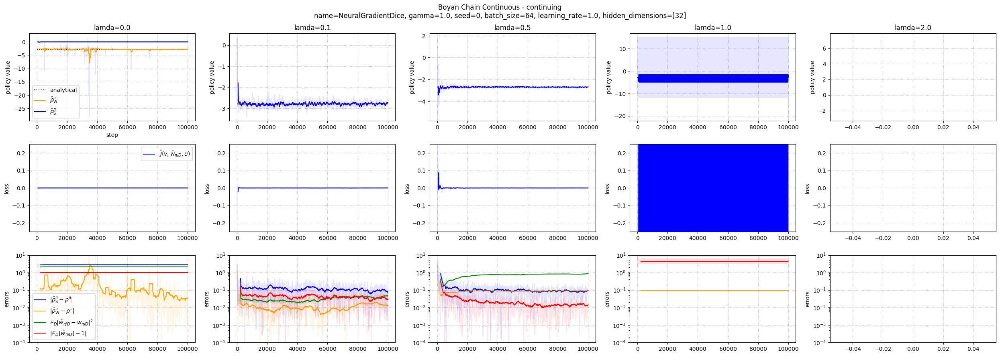

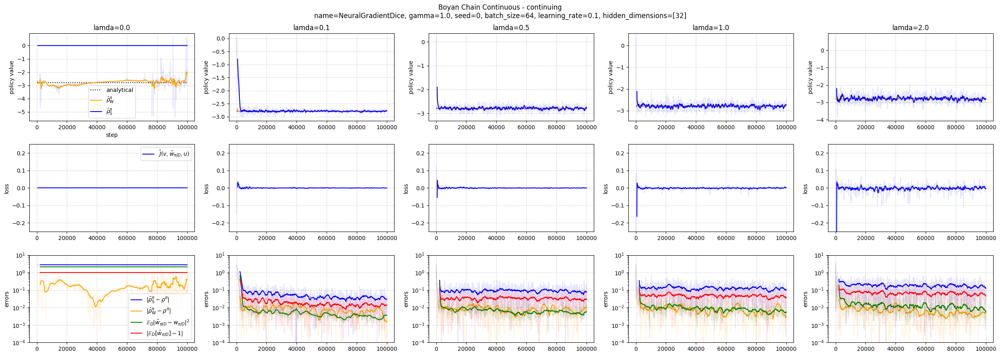

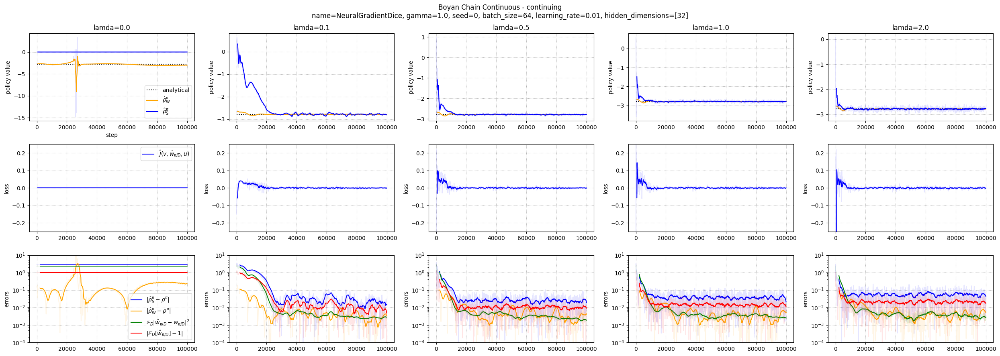

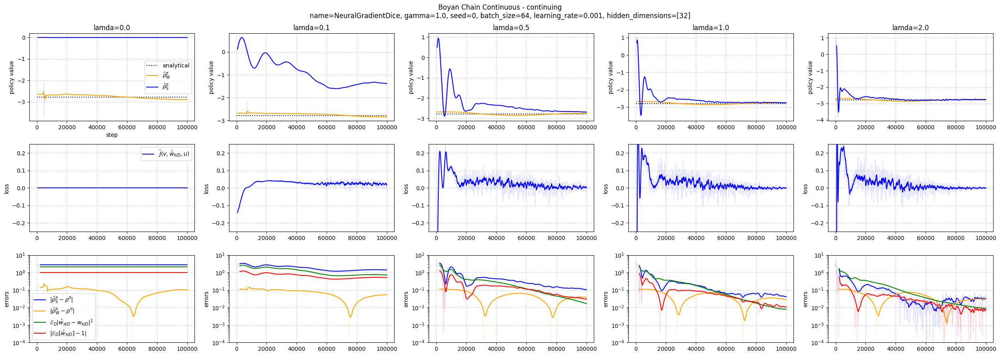

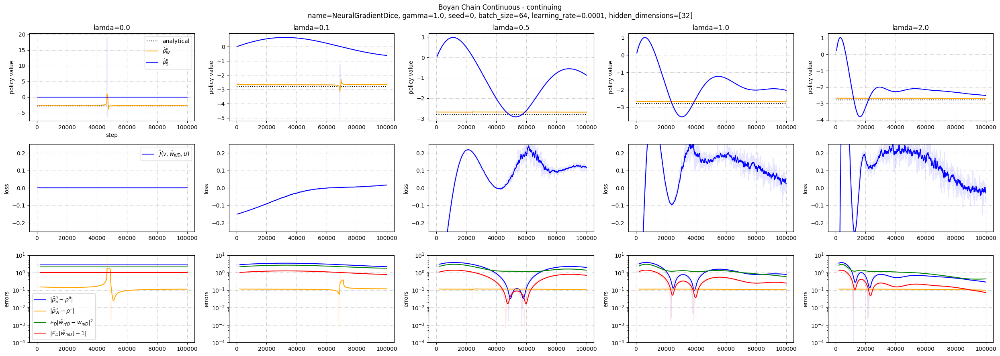

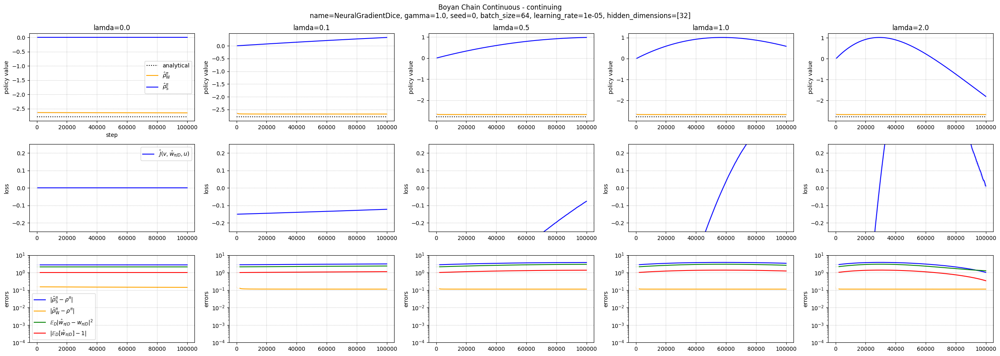

In [ ]:
kind = "continuing"

for learning_rate in [1e0, 1e-1, 1e-2, 1e-3, 1e-4, 1e-5]:
    get_logs_and_plot(
        analytical_solver=analytical_solver[kind],
        hyperparameters_evaluation=[
            {
                "name": "NeuralGradientDice",
                "gamma": gamma[kind],
                "seed": 0,
                "batch_size": batch_size,
                "learning_rate": learning_rate,
                "hidden_dimensions": hidden_dimensions,
                "lamda": lamda_,
            }
                for lamda_ in lamda[kind]
        ],
        ylims=5*[
            { "errors": (1e-4, 1e1), "loss": (-0.25, 0.25), }
        ],
        hyperparameters_dataset={
            "seed": 0,
            "n_samples": n_samples,
            "N": N,
            "kind": kind,
        },
        n_samples_moving_average=5*[
            merge_dicts(
                { "pv_s": 8, "pv_w": 8, },
                { error_name: 24 for error_name in error_names },
                { "loss": 8, }
            )
        ],
        dir_save=os.path.join(dir_images, "continuous"),
    )